![JohnSnowLabs](https://nlp.johnsnowlabs.com/assets/images/logo.png)

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JohnSnowLabs/spark-nlp-workshop/blob/master/tutorials/Certification_Trainings/Healthcare/5.1.Spark_OCR_Multi_Modals.ipynb)

If you are using the `johnsnowlabs` library, please use this  [09.1.Spark_OCR_Multi_Modals](https://github.com/JohnSnowLabs/spark-nlp-workshop/blob/master/healthcare-nlp/09.1.Spark_OCR_Multi_Modals.ipynb) notebook.

# Spark OCR


## Blogposts and videos

- [How to Setup Spark OCR on UBUNTU - Video](https://www.youtube.com/watch?v=cmt4WIcL0nI)

- [Installing Spark NLP and Spark OCR in air-gapped networks (offline mode)
](https://medium.com/spark-nlp/installing-spark-nlp-and-spark-ocr-in-air-gapped-networks-offline-mode-f42a1ee6b7a8)

- [Table Detection & Extraction in Spark OCR](https://medium.com/spark-nlp/table-detection-extraction-in-spark-ocr-50765c6cedc9)

- [Signature Detection in Spark OCR](https://medium.com/spark-nlp/signature-detection-in-spark-ocr-32f9e6f91e3c)

- [GPU image pre-processing in Spark OCR](https://medium.com/spark-nlp/gpu-image-pre-processing-in-spark-ocr-3-1-0-6fc27560a9bb)

**More examples here**

https://github.com/JohnSnowLabs/spark-ocr-workshop

**Colab Setup**

In [ ]:
import json, os
from google.colab import files

if 'spark_jsl.json' not in os.listdir():
  license_keys = files.upload()
  os.rename(list(license_keys.keys())[0], 'spark_ocr.json')

with open('spark_ocr.json') as f:
    license_keys = json.load(f)

# Defining license key-value pairs as local variables
locals().update(license_keys)

In [ ]:
# Installing Spark OCR
! pip install spark-ocr==$OCR_VERSION --extra-index-url=https://pypi.johnsnowlabs.com/$SPARK_OCR_SECRET --upgrade

# Installing pyspark and spark-nlp
! pip install --upgrade -q pyspark==3.4.0 spark-nlp==$PUBLIC_VERSION

<b><h1><font color='darkred'>!!! ATTENTION !!! </font><h1><b>

<b>After running previous cell, <font color='darkred'>RESTART the COLAB RUNTIME </font> and go ahead.<b>

In [1]:
import json, os

with open("spark_ocr.json", 'r') as f:
  license_keys = json.load(f)

# Adding license key-value pairs to environment variables
os.environ.update(license_keys)

# Defining license key-value pairs as local variables
locals().update(license_keys)

In [2]:
import sparkocr
import sys
from pyspark.sql import SparkSession
from sparkocr import start
import base64
from sparkocr.transformers import *
from pyspark.ml import PipelineModel
from pyspark.sql import functions as F
from sparkocr.enums import *
from sparkocr.utils import display_images

In [3]:
# Start spark
spark = sparkocr.start(secret=SPARK_OCR_SECRET,
                       nlp_version=PUBLIC_VERSION
                       )

spark

Spark version: 3.4.0
Spark NLP version: 6.4.0
Spark OCR version: 6.4.0



## Working with tables

### Table Detection

**Load images**

In [4]:
!wget -q raw.githubusercontent.com/JohnSnowLabs/spark-ocr-workshop/master/jupyter/data/tab_images/cTDaR_t10168.jpg -P table_image/
!wget -q raw.githubusercontent.com/JohnSnowLabs/spark-ocr-workshop/master/jupyter/data/tab_images/cTDaR_t10011.jpg -P table_image/

**Read and display images**

In [5]:
from sparkocr.utils import display_tables


    Image #0:
    Origin: file:/content/table_image/cTDaR_t10168.jpg
    Resolution: 0 dpi
    Width: 1061 px
    Height: 1373 px
    Mode: 10
    Number of channels: 1


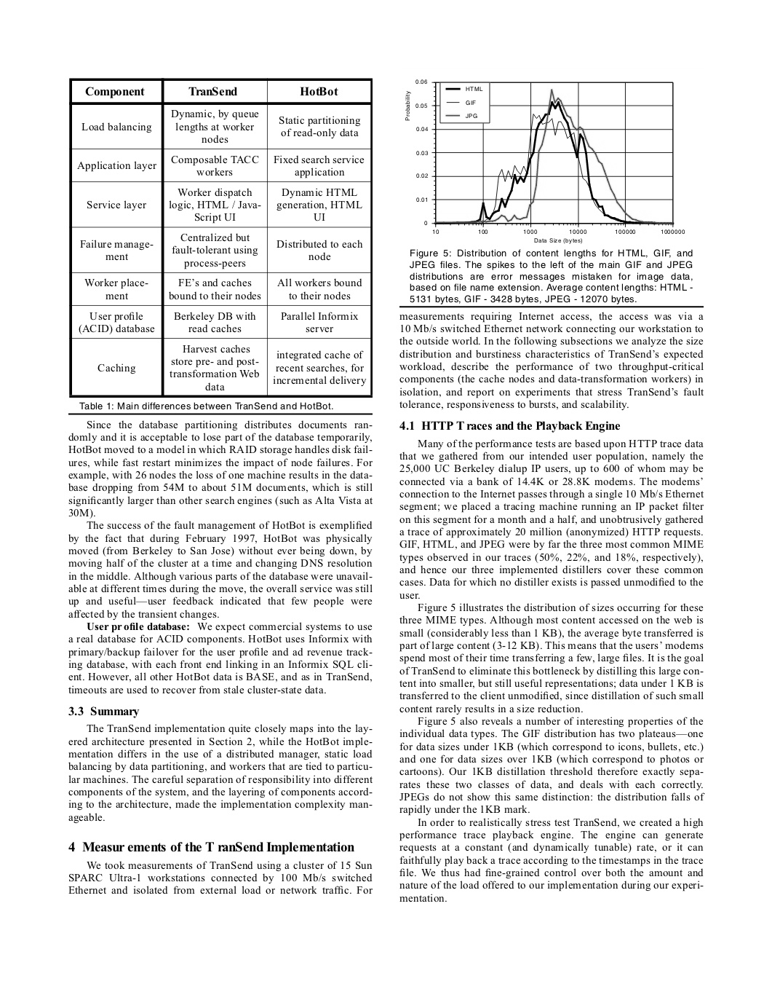


    Image #1:
    Origin: file:/content/table_image/cTDaR_t10011.jpg
    Resolution: 0 dpi
    Width: 816 px
    Height: 1056 px
    Mode: 10
    Number of channels: 1


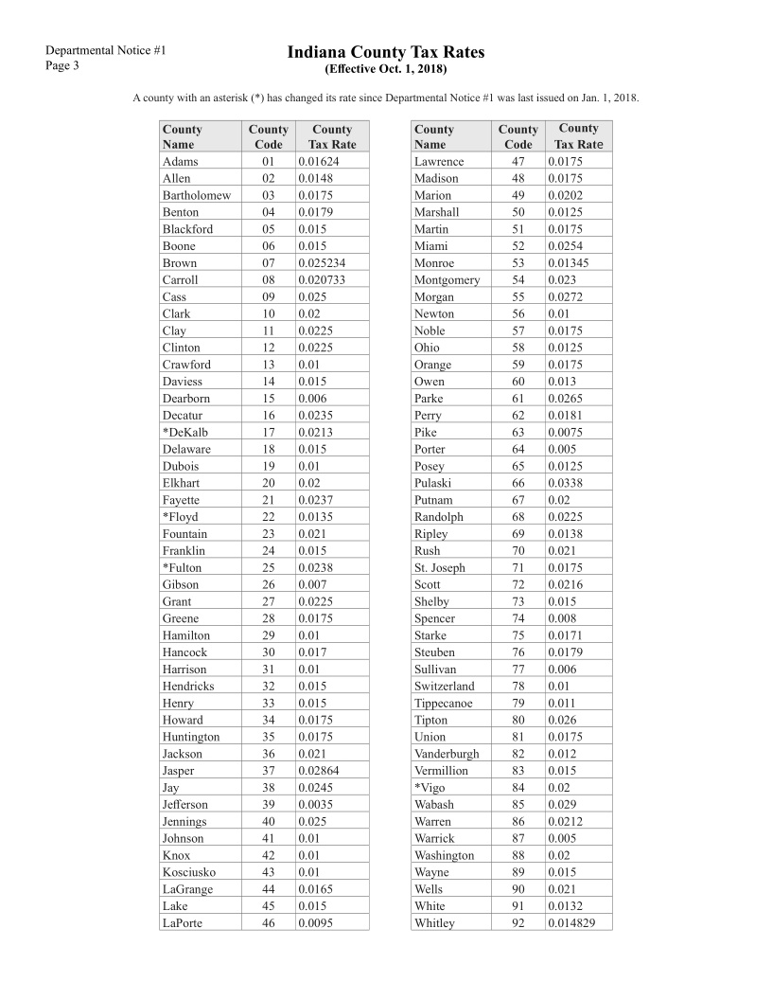

In [6]:
image_df = spark.read.format("binaryFile").load("/content/table_image/*.jpg")

display_images(BinaryToImage().transform(image_df), "image")

**Create OCR Pipeline**

In [7]:
binary_to_image = BinaryToImage()
binary_to_image.setImageType(ImageType.TYPE_3BYTE_BGR)

table_detector = ImageTableDetector.pretrained("general_model_table_detection_v2", "en", "clinical/ocr")
table_detector.setInputCol("image")
table_detector.setOutputCol("table_regions")

draw_regions = ImageDrawRegions()
draw_regions.setInputCol("image")
draw_regions.setInputRegionsCol("table_regions")
draw_regions.setOutputCol("image_with_regions")
draw_regions.setRectColor(Color.red)

pipeline = PipelineModel(stages=[
    binary_to_image,
    table_detector,
    draw_regions
])

general_model_table_detection_v2 download started this may take some time.
Approximate size to download 264.7 MB


**Show results**


    Image #0:
    Origin: file:/content/table_image/cTDaR_t10168.jpg
    Resolution: 0 dpi
    Width: 1061 px
    Height: 1373 px
    Mode: 5
    Number of channels: 3


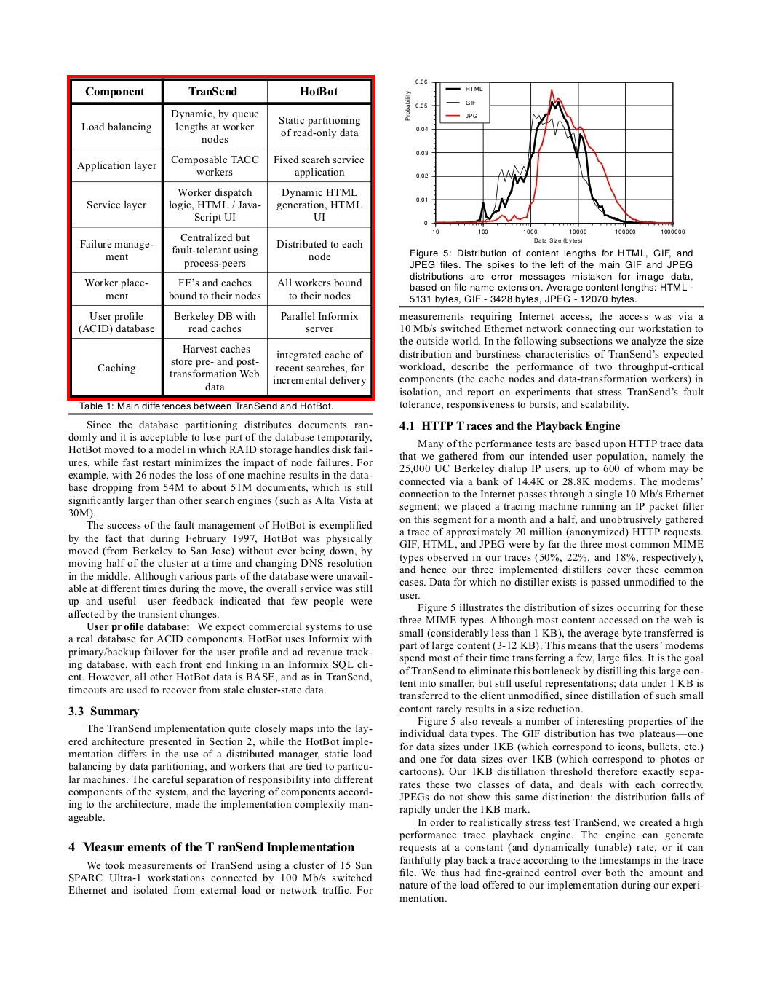


    Image #1:
    Origin: file:/content/table_image/cTDaR_t10011.jpg
    Resolution: 0 dpi
    Width: 816 px
    Height: 1056 px
    Mode: 5
    Number of channels: 3


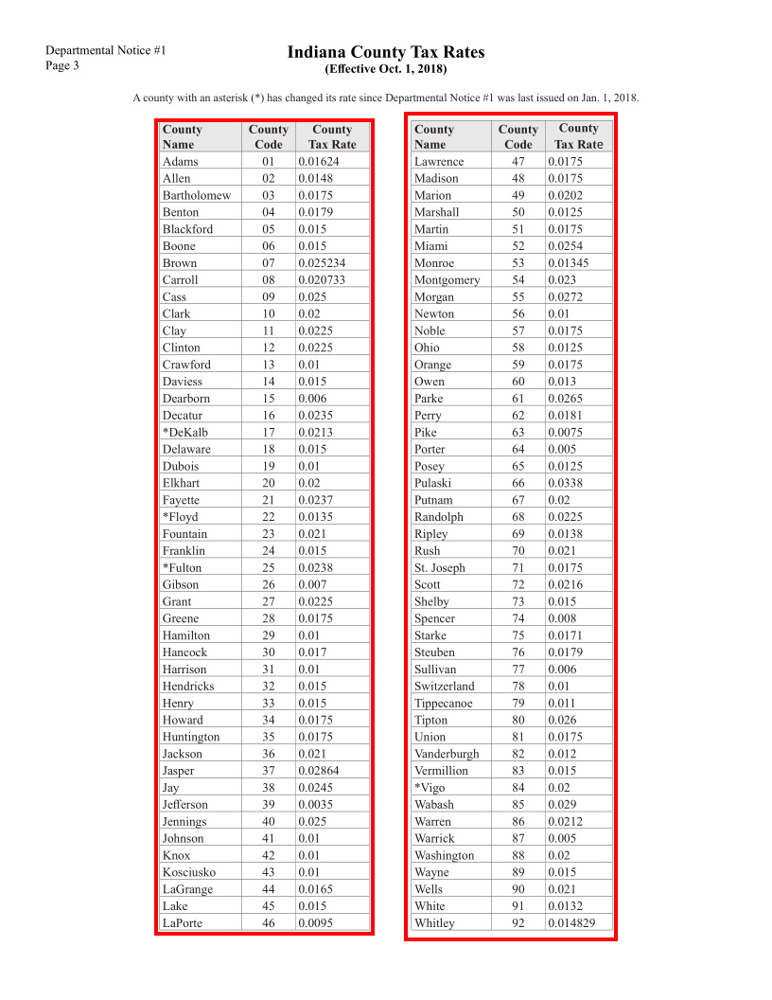

In [8]:
result =  pipeline.transform(image_df)
display_images(result, "image_with_regions")

### Table Recognition

In [9]:
from pyspark.sql.functions import desc, row_number, monotonically_increasing_id
from pyspark.sql.window import Window
import pyspark.sql.functions as f

**Load and display the images.**


    Image #0:
    Origin: file:/content/table_image/cTDaR_t10168.jpg
    Resolution: 0 dpi
    Width: 1061 px
    Height: 1373 px
    Mode: 10
    Number of channels: 1


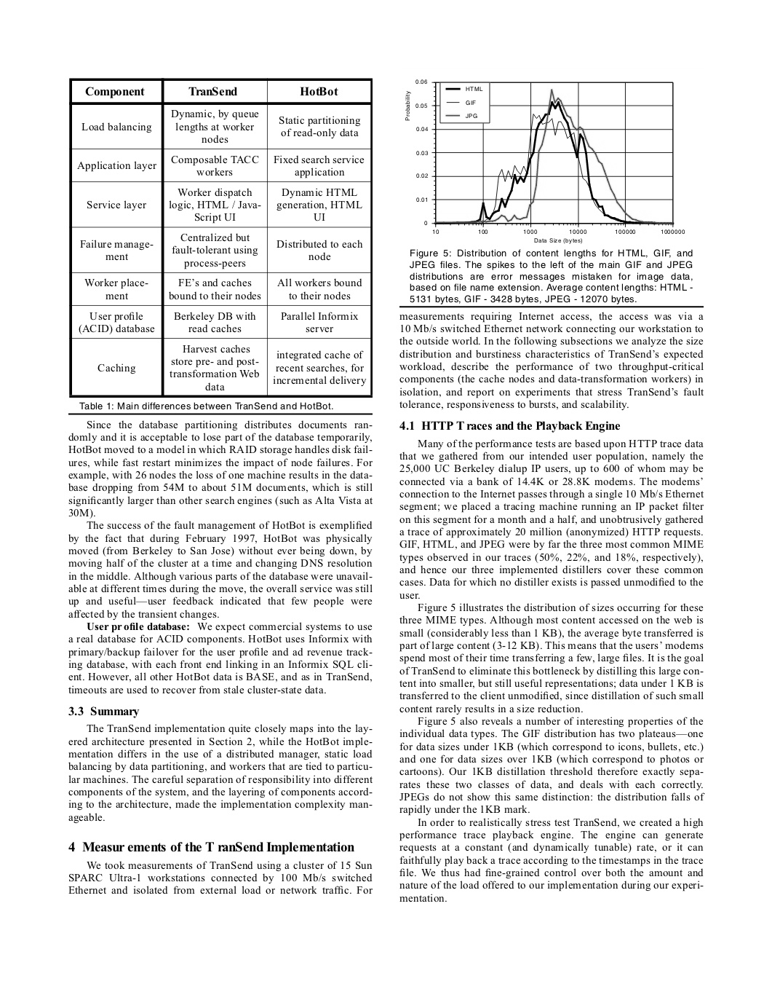


    Image #1:
    Origin: file:/content/table_image/cTDaR_t10011.jpg
    Resolution: 0 dpi
    Width: 816 px
    Height: 1056 px
    Mode: 10
    Number of channels: 1


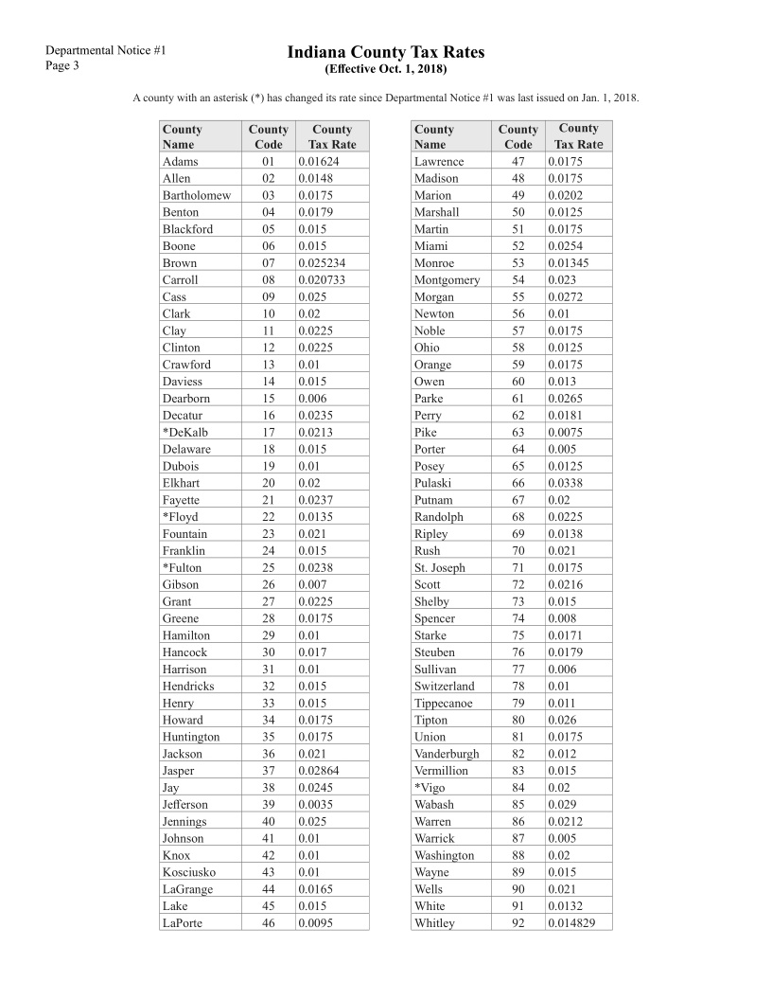

In [10]:
image_df= spark.read.format("binaryFile").load("table_image")

# add index to the dataframe
image_df_with_seq_id = image_df.withColumn('index', row_number().over(Window.orderBy(monotonically_increasing_id())) - 1)

display_images(BinaryToImage().transform(image_df), "image")

**Create OCR pipeline.**

In [11]:
binary_to_image = BinaryToImage()
# need set image type for correct work TableDetection model
binary_to_image.setImageType(ImageType.TYPE_3BYTE_BGR)

table_detector = ImageTableDetector.pretrained("general_model_table_detection_v2", "en", "clinical/ocr")
table_detector.setInputCol("image")
table_detector.setOutputCol("region")

splitter = ImageSplitRegions()
splitter.setInputCol("image")
splitter.setInputRegionsCol("region")
splitter.setOutputCol("table_image")
splitter.setDropCols("image")
splitter.setImageType(ImageType.TYPE_BYTE_GRAY)

scaler = ImageScaler()
scaler.setInputCol("table_image")
scaler.setOutputCol("scaled_image")
scaler.setScaleFactor(2)

cell_detector = ImageTableCellDetector()
cell_detector.setInputCol("scaled_image")
cell_detector.setOutputCol("cells")
cell_detector.setKeepInput(True)

table_recognition = ImageCellsToTextTable()
table_recognition.setInputCol("scaled_image")
table_recognition.setCellsCol('cells')
table_recognition.setMargin(1)
table_recognition.setStrip(True)
table_recognition.setOutputCol('table')


pipeline = PipelineModel(stages=[
    binary_to_image,
    table_detector,
    splitter,
    scaler,
    cell_detector,
    table_recognition
])

general_model_table_detection_v2 download started this may take some time.
Approximate size to download 264.7 MB


**Run the pipeline and display the tables in the images.**


    Image #0:
    Origin: file:/content/table_image/cTDaR_t10168.jpg
    Resolution: 0 dpi
    Width: 419 px
    Height: 443 px
    Mode: 10
    Number of channels: 1


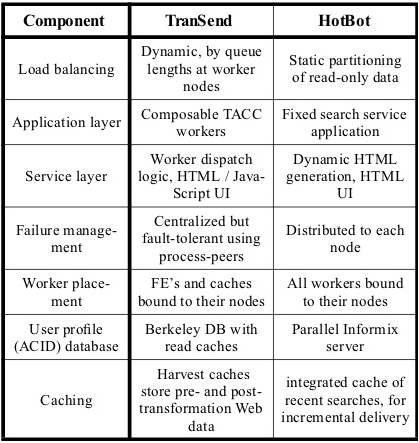


    Image #1:
    Origin: file:/content/table_image/cTDaR_t10011.jpg
    Resolution: 0 dpi
    Width: 222 px
    Height: 872 px
    Mode: 10
    Number of channels: 1


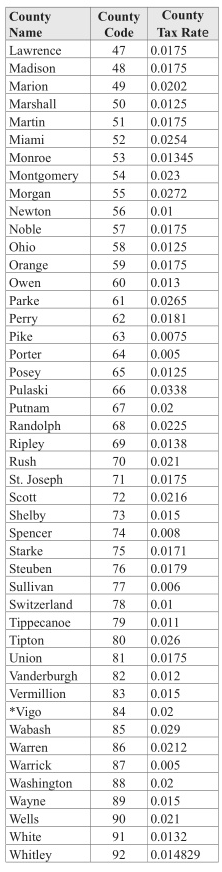


    Image #2:
    Origin: file:/content/table_image/cTDaR_t10011.jpg
    Resolution: 0 dpi
    Width: 229 px
    Height: 859 px
    Mode: 10
    Number of channels: 1


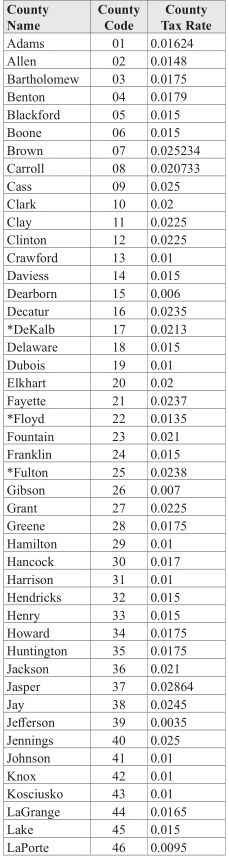

In [12]:
results = pipeline.transform(image_df_with_seq_id).cache()
display_images(results, "table_image")

**Display recognized tables**

In [13]:
display_tables(results)

Filename: cTDaR_t10011.jpg
Page: 0
Table: [0]
Number of Columns: 3


col0,col1,col2
CountyName,CountyCode,CountyTax Rate
Lawrence,47,0.0175
Madison,48,0.0175
Marion,49,0.0202
Marshall,50,0.0125
Martin,S51,0.0175
Miami,52,0.0254
Monroe,53,0.01345
Montgomery,54,0.023
Morgan,55,0.0272


Filename: cTDaR_t10168.jpg
Page: 0
Table: [0]
Number of Columns: 3


col0,col1,col2
Component,TranSend,HotBot
Load balancing,"Dynamic, by queuelengths at workernodes",Static partitioningof read-only data
Application layer,Composable TACCworkers,Fixed search serviceapplication
Service layerFailure manage-ment,"Worker dispatchlogic, HTML / Java-Script UI","Dynamic HTMLgeneration, HTMLUIDistributed to eachnode"
Centralized butfault-tolerant usingprocess-peers,None,None
All workers boundto their nodes,User profile(ACID) database,Berkeley DB withread caches
Parallel Informixserver,Caching,Harvest cachesstore pre- and post-transformation Webdata
"integrated cache ofrecent searches, forincremental delivery",None,None


Filename: cTDaR_t10011.jpg
Page: 0
Table: [1]
Number of Columns: 3


col0,col1,col2
CountyName,CountyCode,CountyTax Rate
Adams,ol,0.01624
Allen,02,0.0148
Bartholomew,rik,0.0175
Benton,04,0.0179
Blackford,os,0.015
Boone,06,0.015
Brown,07,0.025234
Carroll,og,0.020733
Cass,09,0.025


### Table Cell Recognition

**Read and display images**

/tmp/ipykernel_6187/2305608991.py:7: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources



    Image #0:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/tableImage/table4.jpg
    Resolution: 0 dpi
    Width: 1471 px
    Height: 1654 px
    Mode: 10
    Number of channels: 1


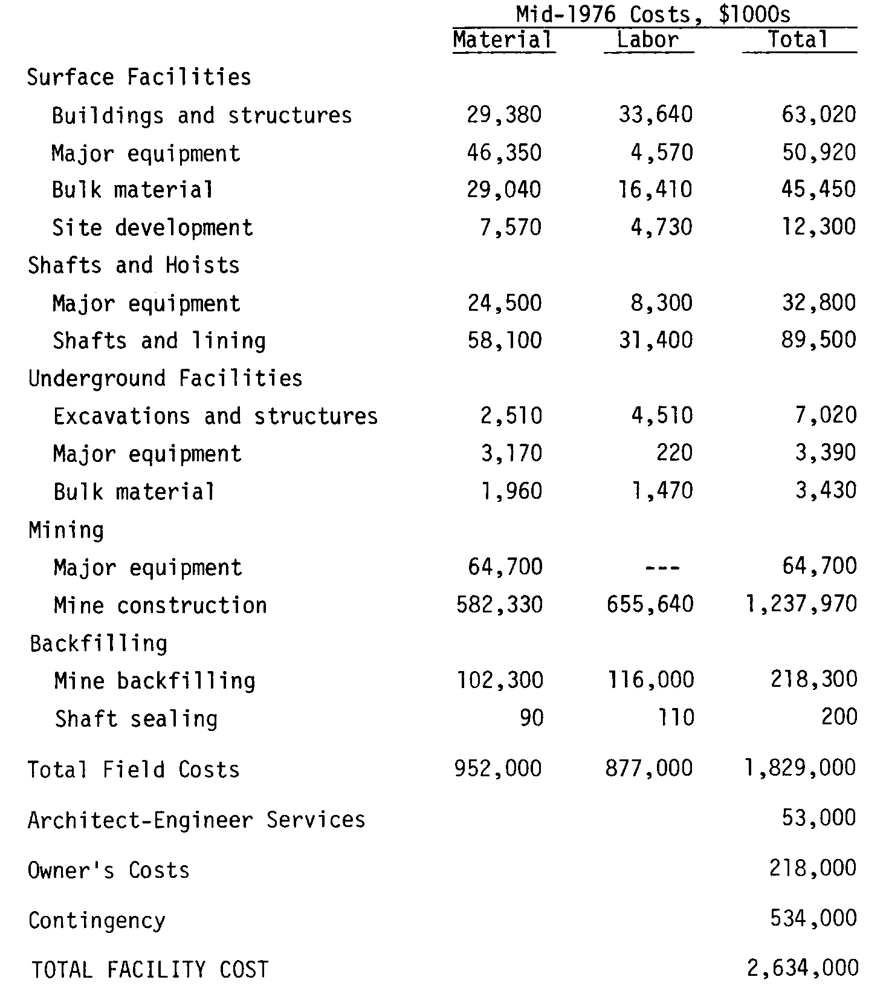


    Image #1:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/tableImage/table2.png
    Resolution: 143 dpi
    Width: 644 px
    Height: 1144 px
    Mode: 10
    Number of channels: 1


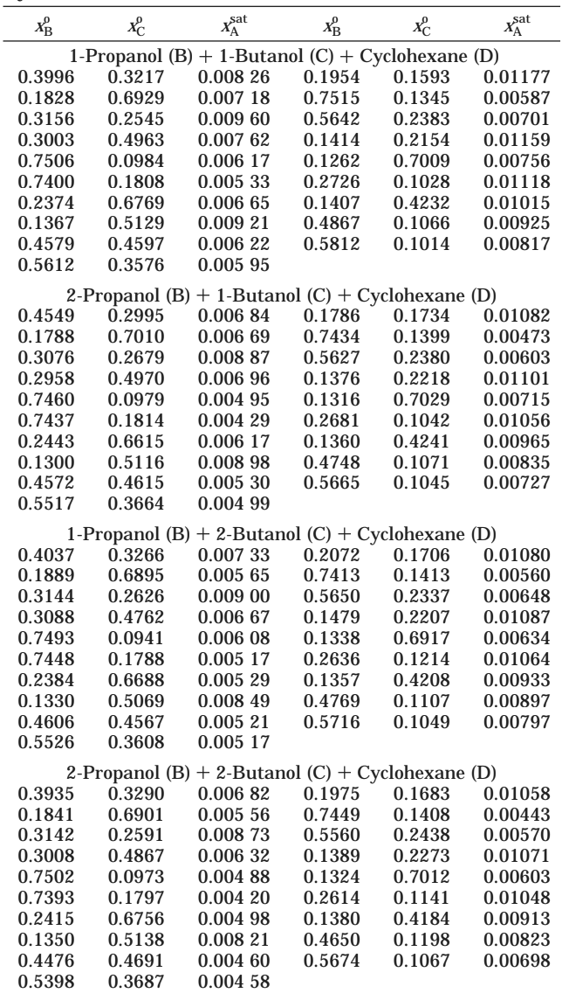


    Image #2:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/tableImage/table0.png
    Resolution: 143 dpi
    Width: 1350 px
    Height: 526 px
    Mode: 10
    Number of channels: 1


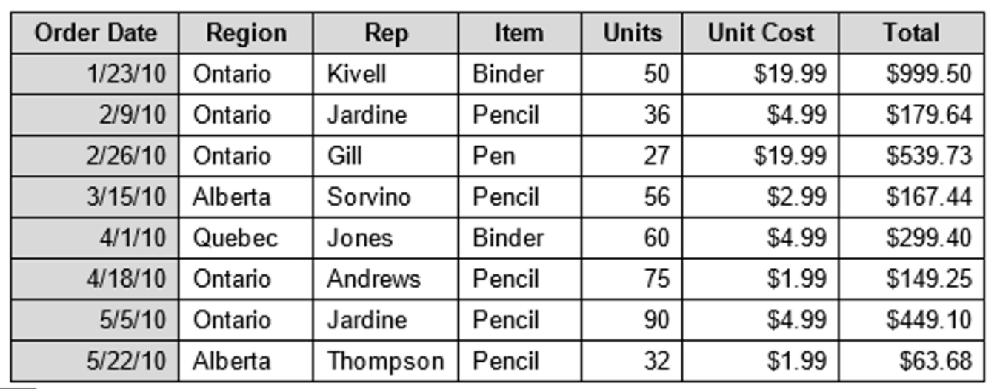


    Image #3:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/tableImage/table4_1.jpg
    Resolution: 0 dpi
    Width: 1000 px
    Height: 1095 px
    Mode: 10
    Number of channels: 1


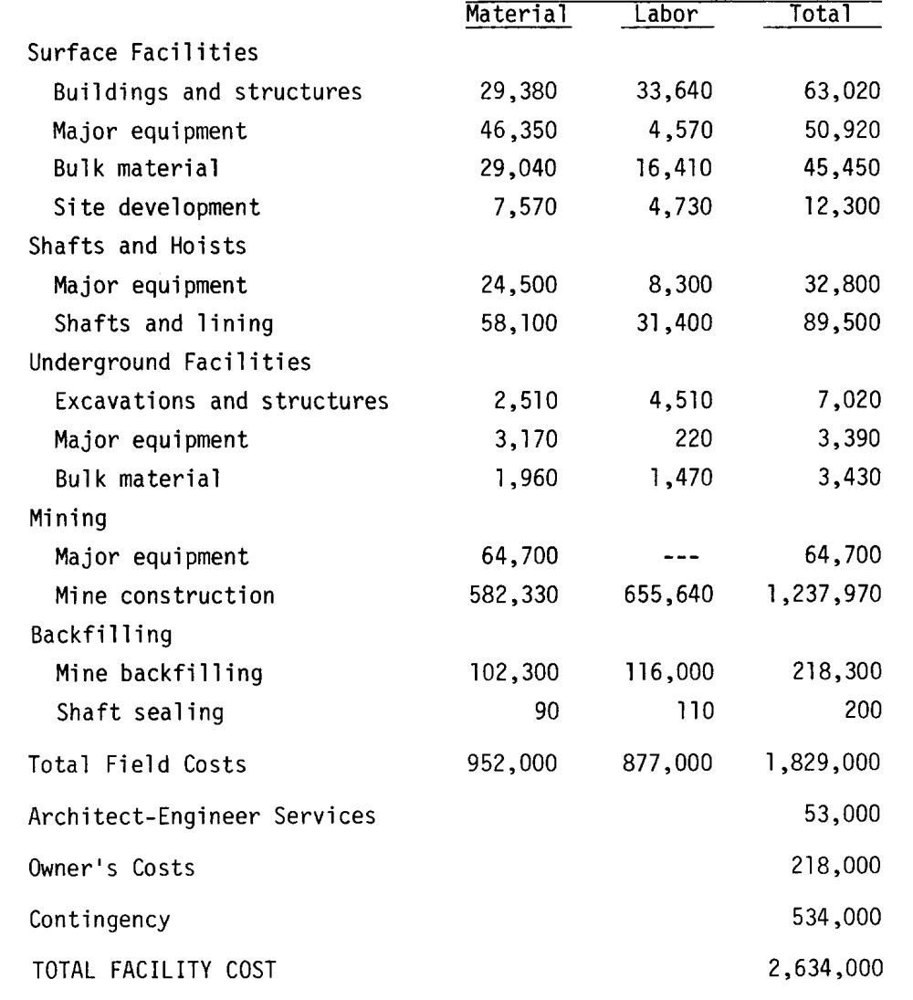

In [14]:
from sparkocr.transformers import *
from sparkocr.enums import *
from sparkocr.utils import display_images, display_table, display_tables
from pyspark.ml import PipelineModel
import pyspark.sql.functions as f

import pkg_resources
test_image_path = pkg_resources.resource_filename('sparkocr', 'resources/ocr/tableImage/table[0,2,4]*.*')
image_df= spark.read.format("binaryFile").load(test_image_path)

display_images(BinaryToImage().transform(image_df), "image")

**Define OCR Pipeline**

In [15]:
binary_to_image = BinaryToImage()
binary_to_image.setImageType(ImageType.TYPE_BYTE_GRAY)
binary_to_image.setInputCol("content")

cell_detector = ImageTableCellDetector()
cell_detector.setInputCol("image")
cell_detector.setOutputCol("cells")
cell_detector.setKeepInput(True)
cell_detector.setAlgoType("morphops")
cell_detector.setDrawDetectedLines(True)

table_recognition = ImageCellsToTextTable()
#table_recognition.setInputCol("output_image")
table_recognition.setInputCol("image")
table_recognition.setCellsCol('cells')
table_recognition.setMargin(2)
table_recognition.setStrip(True)
table_recognition.setOutputCol('table')

pipeline = PipelineModel(stages=[
    binary_to_image,
     cell_detector,
     table_recognition
])

**Run Pipeline**

In [16]:
results = pipeline.transform(image_df).cache()

In [17]:
results= results.na.drop(subset=["cells", "output_image", "table"])


    Image #0:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/tableImage/table4.jpg
    Resolution: 0 dpi
    Width: 1471 px
    Height: 1654 px
    Mode: 10
    Number of channels: 1


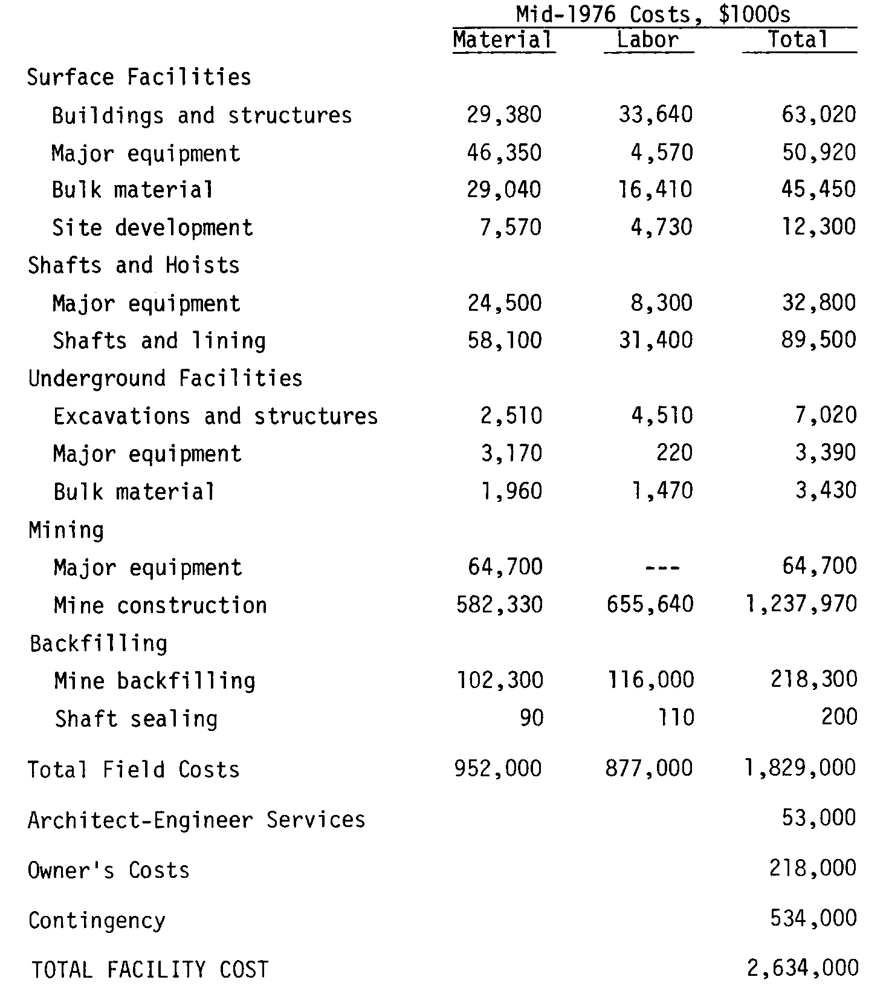


    Image #1:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/tableImage/table2.png
    Resolution: 143 dpi
    Width: 644 px
    Height: 1144 px
    Mode: 10
    Number of channels: 1


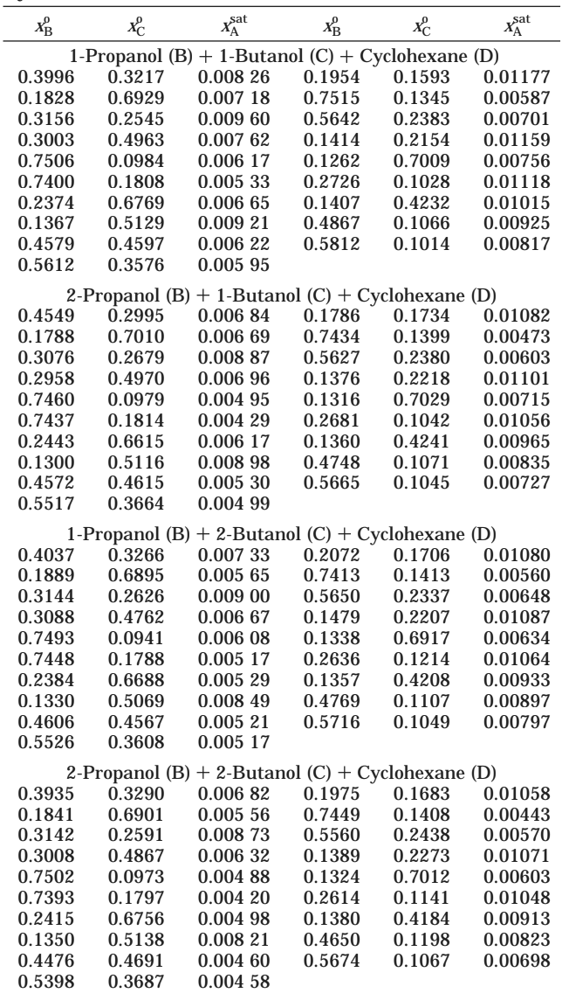


    Image #2:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/tableImage/table0.png
    Resolution: 143 dpi
    Width: 1350 px
    Height: 526 px
    Mode: 10
    Number of channels: 1


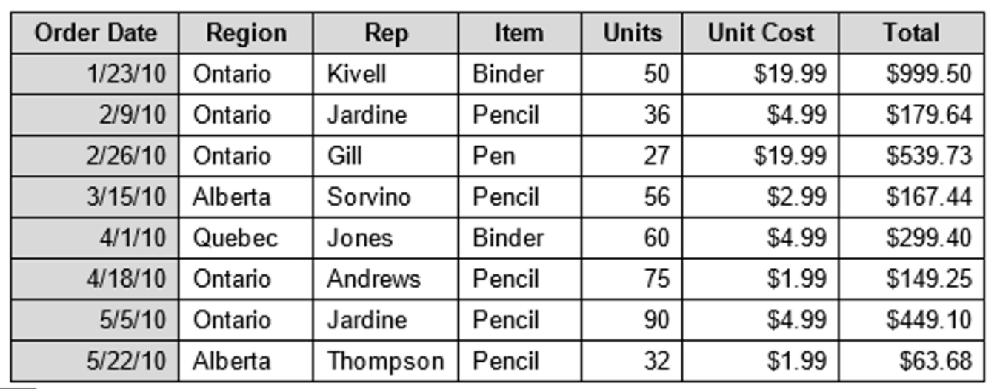


    Image #3:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/tableImage/table4_1.jpg
    Resolution: 0 dpi
    Width: 1000 px
    Height: 1095 px
    Mode: 10
    Number of channels: 1


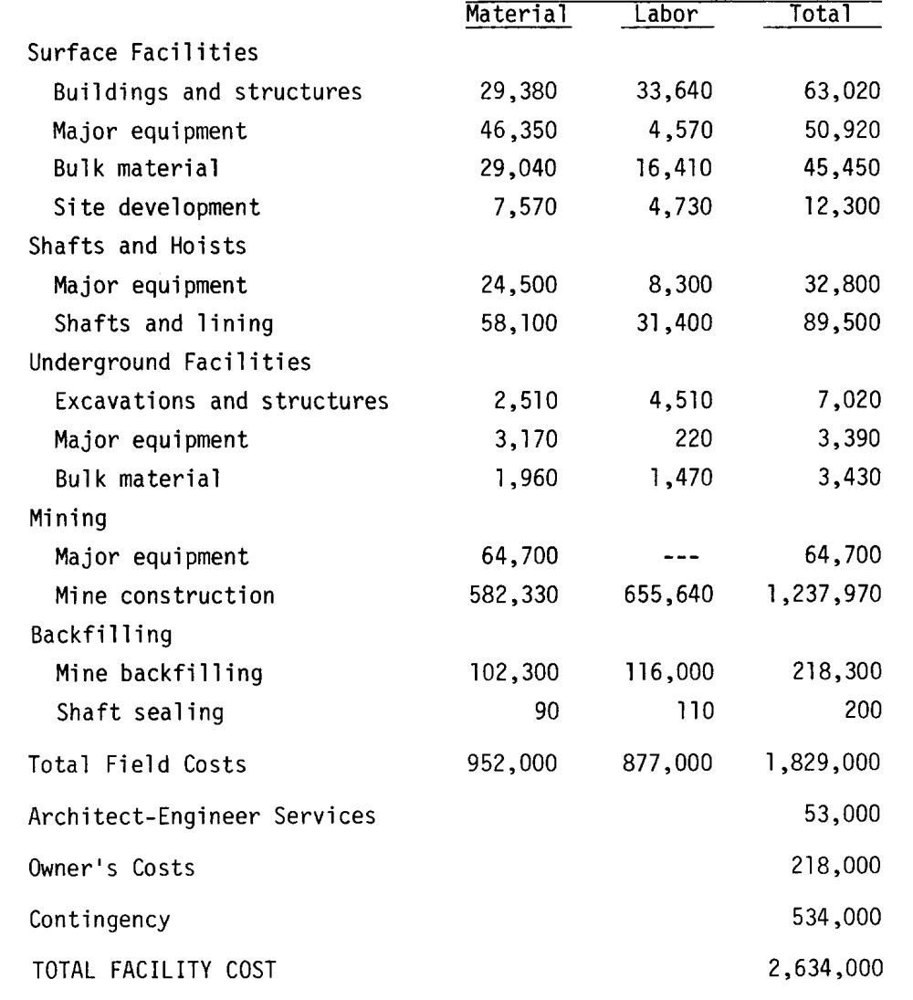

In [18]:
display_images(results, "image")

In [19]:
display_tables(results)

Filename: table0.png
Page: 0
Table: 0
Number of Columns: 7


col0,col1,col2,col3,col4,col5,col6
Order Date,Region,Rep,Item,Empty,Jnit Cost,Total
1/23/10,Ontario,Kivell,Binder,60],$19.99,$999.50
2/9/10,Ontario,Jardine,Pencil,36],$4.99,$179.64
2/26/10,Ontario,TG,Pen,aT],$19.99,$539.73
3/15/10,Alberta,Sorvino,Pencil,66],$2.99,$167.44
4/1/10,Quebec,Jones,Binder,60],$4.99,$299.40
4/18/10,Ontario,Andrews,Pencil,75,$1.99,$149.25
5/5/10,Ontario,Jardine,Pencil,90],$4.99,$449.10
5/22/10,Alberta,Thompsor,Pencil,32],$1.99,$63.68


Filename: table2.png
Page: 0
Table: 0
Number of Columns: 6


col0,col1,col2,col3,col4,col5
xB,Xe,atXN,xB,Xe,atXx
1-],-ropanol (1,3) + 1-Butar,ol (C)+C,iclohexane,(D)
0.3996,0.3217,0.008 26,0.1954,0.1593,0.01177
0.1828,0.6929,0.007 18,0.7515,0.1345,0.00587
0.3156,0.2545,0.009 60,0.5642,0.2383,0.00701
0.3003,0.4963,0.007 62,0.1414,0.2154,0.01159
0.7506,0.0984,0.006 17,0.1262,0.7009,0.00756
0.7400,0.1808,0.005 33,0.2726,0.1028,0.01118
0.2374,0.6769,0.006 65,0.1407,0.4232,0.01015
0.1367,0.5129,0.009 21,0.4867,0.1066,0.00925


Filename: table4.jpg
Page: 0
Table: 0
Number of Columns: 4


col0,col1,col2,col3
Empty,Mid-],976 Costs. $,1000s
Empty,Material,Labor,Total
Surface Facilities,Empty,Empty,Empty
Buildings and structures,"29,380","33,640","63,020"
Major equipment,"46 ,350","4,570","50,920"
Bulk material,"29,040","16,410","45,450"
Site development,"7,570","4,730","12,300"
Shafts and Hoists,Empty,Empty,Empty
Major equipment,"24,500","8,300","32 ,800"
Shafts and lining,"58,100","31,400","89,500"


Filename: table4_1.jpg
Page: 0
Table: 0
Number of Columns: 4


col0,col1,col2,col3
Empty,Material,Labor,__ Total
Surface Facilities,Empty,Empty,Empty
Buildings and structures,"29,380","33,640","63,020"
Major equipment,"46 ,350","4,570","50,920"
Bulk material,"29,040","16,410","45,450"
Site development,"7,570","4,730","12,300"
Shafts and Hoists,Empty,Empty,Empty
Major equipment,"24,500","8,300","32,800"
Shafts and lining,"58,100","31,400","89,500"
Underground Facilities,Empty,Empty,Empty


**Show recognized cells for first image**

In [20]:
table_recognition_csv = ImageCellsToTextTable()
table_recognition_csv.setInputCol("image")
table_recognition_csv.setCellsCol('cells')
table_recognition_csv.setMargin(2)
table_recognition_csv.setStrip(True)
table_recognition_csv.setOutputCol('table')
table_recognition_csv.setOutputFormat('csv')

pipeline_csv = PipelineModel(stages=[
    binary_to_image,
     cell_detector,
     table_recognition_csv
])

In [21]:
results_csv = pipeline_csv.transform(image_df).cache()
print(results_csv.select("table").collect()[2].table)

Order Date,Region,Rep,Item,,Jnit Cost,Total
1/23/10,Ontario,Kivell,Binder,60],$19.99,$999.50
2/9/10,Ontario,Jardine,Pencil,36],$4.99,$179.64
2/26/10,Ontario,TG,Pen,aT],$19.99,$539.73
3/15/10,Alberta,Sorvino,Pencil,66],$2.99,$167.44
4/1/10,Quebec,Jones,Binder,60],$4.99,$299.40
4/18/10,Ontario,Andrews,Pencil,75,$1.99,$149.25
5/5/10,Ontario,Jardine,Pencil,90],$4.99,$449.10
5/22/10,Alberta,Thompsor,Pencil,32],$1.99,$63.68



##Handwritten Detection

In [22]:
!wget -q https://raw.githubusercontent.com/JohnSnowLabs/spark-ocr-workshop/master/jupyter/data/handwritten/page1.jpeg


    Image #0:
    Origin: file:/content/page1.jpeg
    Resolution: 0 dpi
    Width: 1705 px
    Height: 2203 px
    Mode: 10
    Number of channels: 1


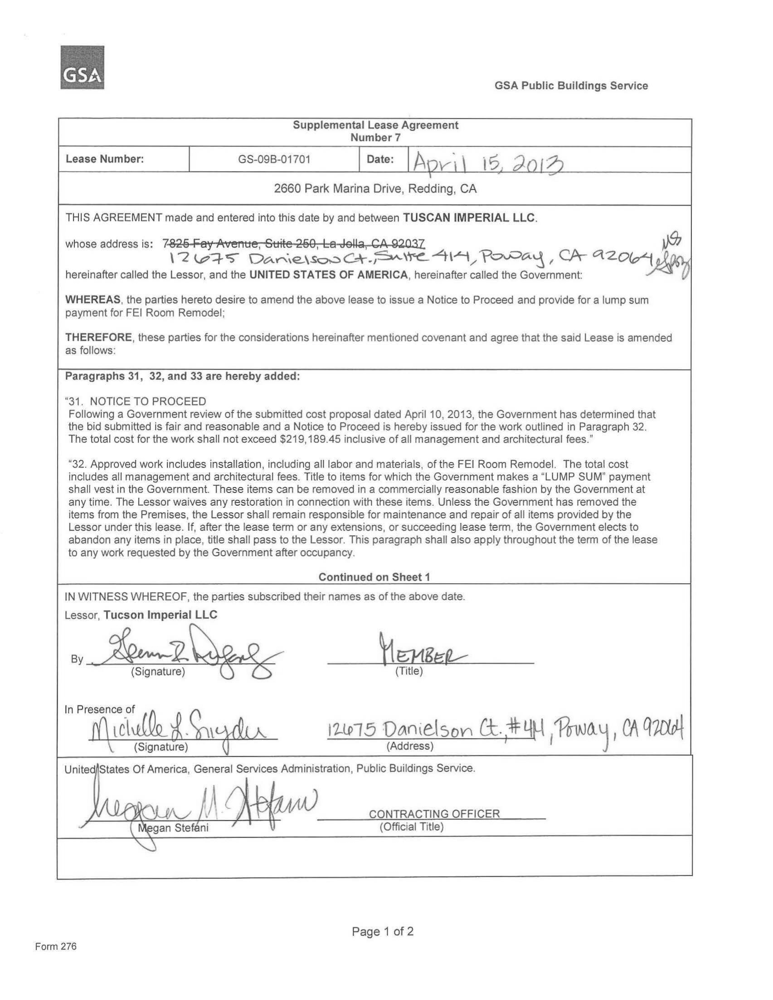

In [23]:
image_df = spark.read.format("binaryFile").load('page1.jpeg')

display_images(BinaryToImage().transform(image_df), "image")

In [24]:
binary_to_image = BinaryToImage()
binary_to_image.setImageType(ImageType.TYPE_3BYTE_BGR)

pretrained_model = ("image_handwritten_detector_gsa0803", "en", "public/ocr/models")

handwritten_detector = ImageHandwrittenDetector() \
    .pretrained(*pretrained_model) \
    .setInputCol("image") \
    .setOutputCol("handwritten_regions") \
    .setScoreThreshold(0.4)

draw_regions = ImageDrawRegions() \
    .setInputCol("image") \
    .setInputRegionsCol("handwritten_regions") \
    .setOutputCol("image_with_regions") \
    .setFontSize(16) \
    .setRectColor(Color.red)

pipeline = PipelineModel(stages=[
    binary_to_image,
    handwritten_detector,
    draw_regions
])

image_handwritten_detector_gsa0803 download started this may take some time.
Approximate size to download 244.5 MB



    Image #0:
    Origin: file:/content/page1.jpeg
    Resolution: 0 dpi
    Width: 1705 px
    Height: 2203 px
    Mode: 5
    Number of channels: 3


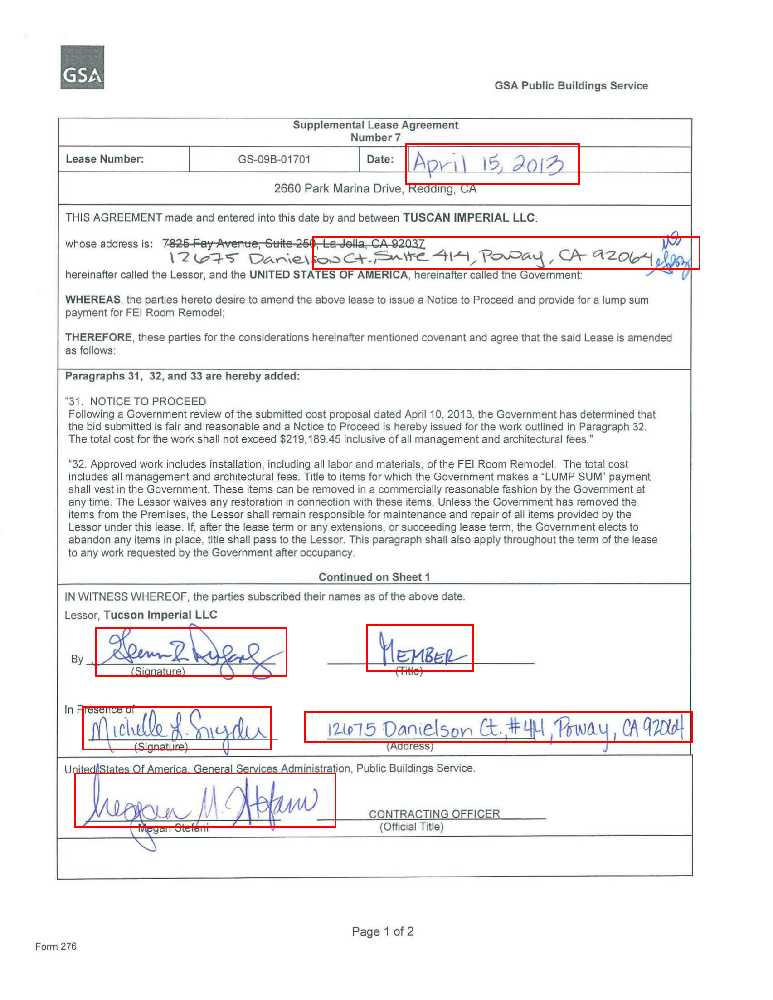

In [25]:
result =  pipeline.transform(image_df).cache()
display_images(result, "image_with_regions")

##Signature Detection

In [26]:
!wget -q https://raw.githubusercontent.com/JohnSnowLabs/spark-ocr-workshop/master/jupyter/data/signature/image_147.png

In [27]:
image_file = 'image_147.png'
image_df = spark.read.format("binaryFile").load(image_file)

display_images(BinaryToImage().transform(image_df), "image")

Output hidden; open in https://colab.research.google.com to view.

**Define OCR Pipeline**

In [28]:
binary_to_image = BinaryToImage()
binary_to_image.setImageType(ImageType.TYPE_3BYTE_BGR)

pretrained_model = ("image_handwritten_detector_gsa0628", "en", "public/ocr/models")
signature_detector = ImageHandwrittenDetector() \
    .pretrained(*pretrained_model) \
    .setInputCol("image") \
    .setOutputCol("signature_regions") \
    .setOutputLabels(["signature"]) \
    .setScoreThreshold(0.4)

draw_regions = ImageDrawRegions() \
    .setInputCol("image") \
    .setInputRegionsCol("signature_regions") \
    .setOutputCol("image_with_regions") \
    .setFontSize(16) \
    .setRectColor(Color.red)

pipeline = PipelineModel(stages=[
    binary_to_image,
    signature_detector,
    draw_regions
])

image_handwritten_detector_gsa0628 download started this may take some time.
Approximate size to download 243.9 MB


**Run pipeline and show results**

In [29]:
result =  pipeline.transform(image_df).cache()
display_images(result, "image_with_regions")

Output hidden; open in https://colab.research.google.com to view.

## Visual Document Ner

In [30]:
from sparkocr.transformers import ImageToHocr, VisualDocumentNer, BinaryToImage
from sparkocr.utils import display_images, display_image

In [31]:
import pkg_resources
test_image_path = pkg_resources.resource_filename('sparkocr', 'resources/ocr/images/SROIE/')
bin_df = spark.read.format("binaryFile").load(test_image_path)
bin_df.show()

+--------------------+--------------------+-------+--------------------+
|                path|    modificationTime| length|             content|
+--------------------+--------------------+-------+--------------------+
|file:/usr/local/l...|2026-06-20 15:39:...|3378240|[FF D8 FF E0 00 1...|
+--------------------+--------------------+-------+--------------------+



In [32]:
image_df = BinaryToImage().transform(bin_df)
display_images(image_df)

Output hidden; open in https://colab.research.google.com to view.

In [33]:
binary_to_image = BinaryToImage()\
    .setOutputCol("image")

img_to_hocr = ImageToHocr()\
    .setInputCol("image")\
    .setOutputCol("hocr")\
    .setIgnoreResolution(False)\
    .setOcrParams(["preserve_interword_spaces=0"])

tokenizer = HocrTokenizer() \
    .setInputCol("hocr") \
    .setOutputCol("tokens")

doc_ner = VisualDocumentNer()\
    .pretrained("visual_document_NER_SROIE0526", "en", "public/ocr/models")\
    .setInputCols(["tokens", "image"])

# OCR pipeline
ner_pipeline = PipelineModel(stages=[
    binary_to_image,
    img_to_hocr,
    tokenizer,
    doc_ner
])

visual_document_NER_SROIE0526 download started this may take some time.
Approximate size to download 399.1 MB


In [34]:
results = ner_pipeline.transform(bin_df).cache()

In [35]:
pd_df = results.select('entities').toPandas().explode('entities')

pd_df['label'] = pd_df.entities.apply(lambda a : a[3])
pd_df['chunk'] = pd_df.entities.apply(lambda a : a[4]['word'])
pd_df[pd_df['label'] != "O"][['label', 'chunk']].drop_duplicates()

,label,chunk
0,B-COMPANY,aeon
0,B-COMPANY,co
0,B-COMPANY,.
0,B-COMPANY,taman
0,B-COMPANY,maluri
0,B-TOTAL,476
0,B-DATE,11
0,B-DATE,05


## Visual Document Classifier

In [36]:
import pkg_resources
test_image_path = pkg_resources.resource_filename('sparkocr', 'resources/ocr/images/document_classification/')
bin_df = spark.read.format("binaryFile").load(test_image_path)
bin_df.show()

+--------------------+--------------------+------+--------------------+
|                path|    modificationTime|length|             content|
+--------------------+--------------------+------+--------------------+
|file:/usr/local/l...|2026-06-20 15:39:...|429583|[FF D8 FF E0 00 1...|
|file:/usr/local/l...|2026-06-20 15:39:...|412534|[FF D8 FF E0 00 1...|
+--------------------+--------------------+------+--------------------+




    Image #0:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/images/document_classification/letter.jpg
    Resolution: 72 dpi
    Width: 2400 px
    Height: 3150 px
    Mode: 10
    Number of channels: 1


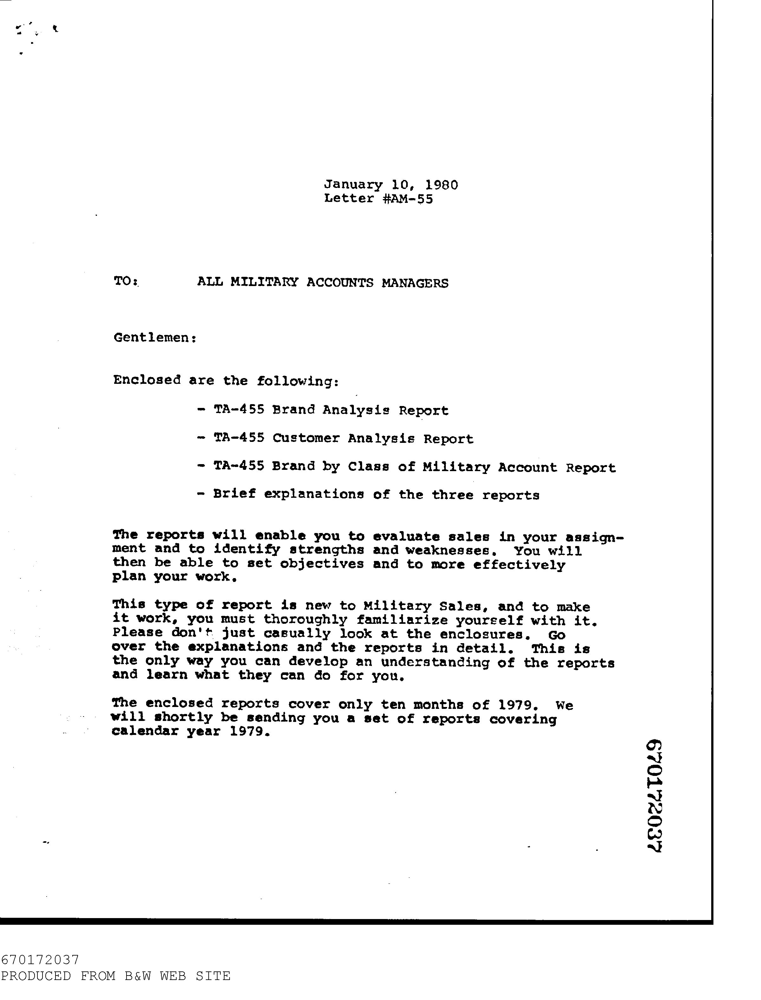


    Image #0:
    Origin: file:/usr/local/lib/python3.12/dist-packages/sparkocr/resources/ocr/images/document_classification/samplecv.jpg
    Resolution: 72 dpi
    Width: 2544 px
    Height: 3296 px
    Mode: 10
    Number of channels: 1


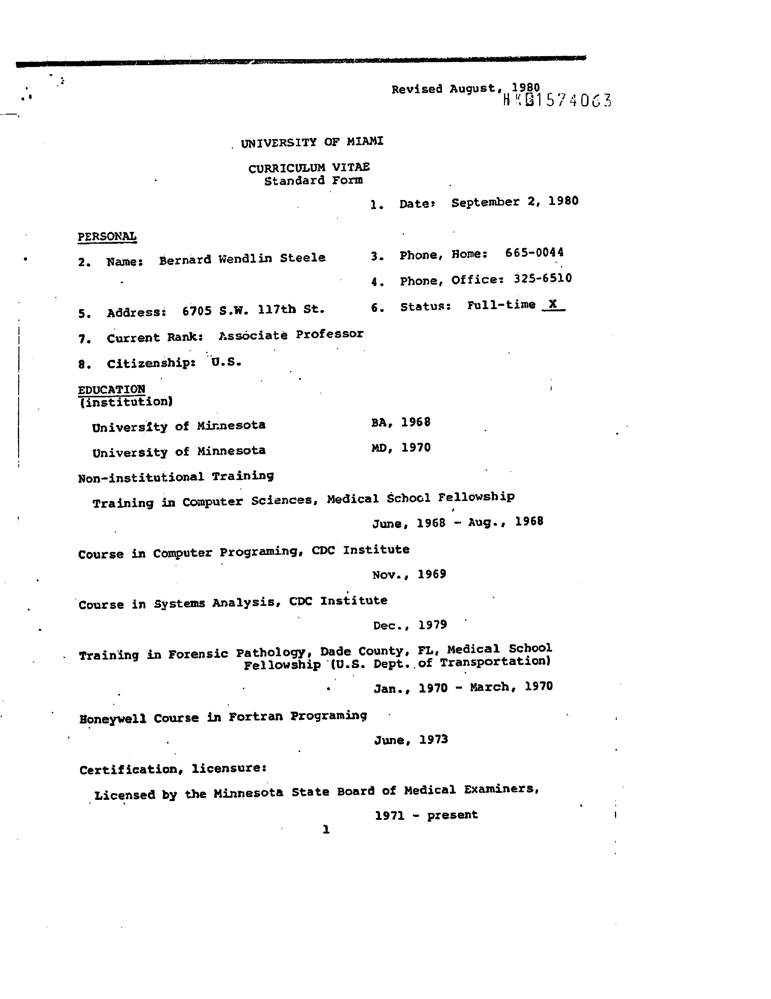

In [37]:
for item in BinaryToImage().transform(bin_df).select("image").collect():
    display_image(item.image)

In [38]:
binary_to_image = BinaryToImage()\
    .setOutputCol("image")

img_to_hocr = ImageToHocr()\
    .setInputCol("image")\
    .setOutputCol("hocr")\
    .setIgnoreResolution(False)\
    .setOcrParams(["preserve_interword_spaces=0"])

doc_classifier = VisualDocumentClassifier()\
    .pretrained("visual_document_classifier_tobacco3482", "en", "clinical/ocr")\
    .setInputCol("hocr")\
    .setLabelCol("label")\
    .setConfidenceCol("conf")

# OCR pipeline
classifier_pipeline = PipelineModel(stages=[
    binary_to_image,
    img_to_hocr,
    doc_classifier
])

visual_document_classifier_tobacco3482 download started this may take some time.
Approximate size to download 398.1 MB


In [39]:
results = classifier_pipeline.transform(bin_df)

In [40]:
import pyspark.sql.functions as f

path_array = f.split(results['path'], '/')
results = results.withColumn('filename', path_array.getItem(f.size(path_array)- 1)) \
       .select("filename", "label", "conf") \
       .show(truncate=False)

/usr/local/lib/python3.12/dist-packages/pyspark/sql/column.py:458: FutureWarning: A column as 'key' in getItem is deprecated as of Spark 3.0, and will not be supported in the future release. Use `column[key]` or `column.key` syntax instead.
  warnings.warn(


+------------+------+----------+
|filename    |label |conf      |
+------------+------+----------+
|letter.jpg  |Letter|0.99602795|
|samplecv.jpg|Resume|0.9914589 |
+------------+------+----------+



**Classes in visual_document_classifier_tobacco3482**
- Advertisement
- Email
- Form
- Letter
- Memo
- Report
- Resume
- Scientific

